# <span style="color:lightblue"><center> **CLASSIFICAÇÃO DOS EPISÓDIOS DE MORTE DECORRENTE DA CIRROSE**</center></span>

A seguir, vamos elaborar um processo de classificação com base no dataset [Liver Cirrhosis Stage Classification](https://www.kaggle.com/datasets/aadarshvelu/liver-cirrhosis-stage-classification), com o objetivo de classificar a coluna **"Situação"**. Ou seja, criaremos modelos com Regressão Logística, Árvore de Decisão e Rede Neural para identificar os casos de Sobrevivência, Morte e Transplante dos pacientes de cirrose, vistos na EDA.

Para isso, nós realizamos 3 classificações diferentes:

**1. Morte, Sobrevivência e Transplante**
- Essa primeira classificação contém as 3 classes, não modificamos nada no dataset. O ponto dela é ser capaz de distinguir os 3 casos individualmente.

**2. Mesclando Sobrevivência e Transplante**
- Aqui, nós juntamos as classes *Sobrevivência* e *Transplante* em uma só, com a finalidade de identificar binariamente a situação dos pacientes estudados: ou morto ou vivo.

**3. Ignorando Evento Transplante**
- Por último, fizemos uma classificação deixando de lado a classe *Transplante*, levando em consideração apenas os atributos dos pacientes que sobreviveram que não necessitaram da operação.

### Importando as Bibliotecas

In [334]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from joblib import dump
from sklearn import tree

### Importação dos Dados

* Antes de tudo vamos importar o csv "liver_cirrhosis_v3". Essa versão foi separada previamente durante a etapa de limpeza de dados, removendo algumas variáveis da tabela e deixando apenas as mais relevantes para a classificação de casos de morte. Esses atributos são:

    - `Situação (Sobreviveu, Transplante ou Morte)`
    - `Idade (dias)`
    - `Sexo (M ou F)`
    - `Bilirrubina (mg/dl)`
    - `Albumina (gm/dl)`
    - `Fosfatase Alcalina (U/L)`
    - `Aspartato Aminotransferase (U/L)`
    - `Plaquetas (ml/1000)`
    - `Tempo de Protrombina (s)`
    - `Estágio (1, 2 ou 3)`

In [335]:
df = pd.read_csv("../data/dados_processados/liver_cirrhosis_v3.csv")

df['Sexo'] = pd.factorize(df['Sexo'])[0]
df

,Situação,Idade,Sexo,Bilirrubina(mg/dl),Albumina(gm/dl),Fosfatase_Alcalina (U/L),Aspartato_Aminotransferase(U/L),Plaquetas(ml/1000),Tempo_de_Protrombina(s),Estágio
0,Sobreviveu,18499,0,0.5,4.04,598.000000,52.700000,256.0,9.9,1
1,Sobreviveu,19724,1,0.5,3.93,663.000000,45.000000,220.0,10.8,2
2,Sobreviveu,11839,0,0.5,3.54,1243.000000,122.450000,225.0,10.0,2
3,Morte,16467,0,0.7,3.74,1024.000000,77.500000,151.0,10.2,2
4,Morte,21699,0,1.9,3.54,1052.000000,108.500000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...,...
9632,Sobreviveu,17897,0,0.7,3.49,1982.655769,122.556346,243.0,9.7,1
9633,Sobreviveu,23376,0,1.8,3.24,1982.655769,122.556346,139.0,10.5,1
9634,Morte,24585,0,2.1,3.48,2045.000000,89.900000,412.0,11.8,3
9635,Sobreviveu,21324,0,0.9,3.40,1098.000000,122.450000,228.0,10.3,2


<br><br>

A seguir, a seção *Classificação 1* possui explicações detalhadas sobre cada trecho. Nas seções seguintes (*Classificação 2 e Classificação 3*) serão feitas as mesmas análises, porém com ajustes nas classes.

---
# Classificação 1: Morte, Sobrevivência e Transplante
---

## **Divisão para Treino/Teste**

* Com o dataset extraído, a próxima etapa será dividir as variáveis X e Y. Como queremos classificar a coluna "Situação" e prever os casos de "sobrevivência, morte e transplante", vamos definir essa coluna como sendo a Y. O resto das colunas usaremos como valores de entrada sendo a variável X

* Além disso, vamos também dividir cada uma de nossas variáveis em duas partes, uma fração para treinos e outra para testes. Nesse caso, decidimos dividir 80% dos valores para treino e o restante, que seria 20%, para os testes mais para frente. Perceba que esse dataset tem 9637 linhas, logo ficarão 7709 linhas para treino e 1928 para testes.

In [336]:
df1 = df.copy()

# Obtendo as variáveis x e y para treinar o modelo 
X1  = df1.drop(columns=['Situação']).values
y1 = df1['Situação'].values

# Dividindo 80% da matriz para treinar o modelo e 20% para os testes
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2)
print("Tamanho separado para treinos: " + str(len(X_train1)))
print("Tamanho separado para testes: " + str(len(X_test1)) + "\n")

print(X1)
print(y1)

Tamanho separado para treinos: 7709
Tamanho separado para testes: 1928

[[1.8499e+04 0.0000e+00 5.0000e-01 ... 2.5600e+02 9.9000e+00 1.0000e+00]
 [1.9724e+04 1.0000e+00 5.0000e-01 ... 2.2000e+02 1.0800e+01 2.0000e+00]
 [1.1839e+04 0.0000e+00 5.0000e-01 ... 2.2500e+02 1.0000e+01 2.0000e+00]
 ...
 [2.4585e+04 0.0000e+00 2.1000e+00 ... 4.1200e+02 1.1800e+01 3.0000e+00]
 [2.1324e+04 0.0000e+00 9.0000e-01 ... 2.2800e+02 1.0300e+01 2.0000e+00]
 [2.8650e+04 1.0000e+00 8.0000e-01 ... 9.7000e+01 1.1200e+01 3.0000e+00]]
['Sobreviveu' 'Sobreviveu' 'Sobreviveu' ... 'Morte' 'Sobreviveu' 'Morte']


## **Normalização dos Dados**

* Seguindo, agora é hora de normalizar os dados que separamos. Para isso é utilizado o objeto **StandardScaler** e seus métodos *fit_transform()* e *fit()*. Depois de ser aplicada a normalização, nós salvamos o scaler na pasta **scalers** com nome **death_scaler.joblib** para possíveis usos futuros.

In [337]:
# Normalizando os dados extraídos do dataset
scaler1 = StandardScaler()
X_train1 = scaler1.fit_transform(X_train1)
X_test1 = scaler1.transform(X_test1)

# Salvando o scaler para uso futuro
print("O modelo do scaler foi salvo em:")
dump(scaler1, 'scalers/death_scaler1.joblib')

O modelo do scaler foi salvo em:


['scalers/death_scaler1.joblib']

## **Regressão Logística**

* Nosso primeiro modelo de classificação será utilizando Regressão Logística. Vamos utilizar o objeto **Logistic Regression** e dar um *fit()* para poder treinar nosso modelo, e depois salvar a predição numa variável separada. Os resultados da regressão são exibidos através de uma tabela de resultados, com a precisão de cada classe e acurácia geral, e também uma matriz de confusão com as 3 classes.

* Por fim, o modelo de Regressão Logística é salvo na pasta **models** no arquivo nomeado **death_logreg.joblib** para que seja mais fácil de acessá-lo caso seja necessário.

In [338]:
logreg1 = LogisticRegression(max_iter=4000, n_jobs=-1, C=0.1, penalty='l2')
logreg1.fit(X_train1, y_train1)

# Predict do teste
y_pred1 = logreg1.predict(X_test1)

# Tabela de Resultados
print("Report - Regressão Logística:")
print(classification_report(y_test1, y_pred1, zero_division=0))

Report - Regressão Logística:
              precision    recall  f1-score   support

       Morte       0.73      0.55      0.62       744
  Sobreviveu       0.70      0.89      0.78      1073
 Transplante       0.00      0.00      0.00       111

    accuracy                           0.71      1928
   macro avg       0.48      0.48      0.47      1928
weighted avg       0.67      0.71      0.68      1928



* Na regressão logística estamos obtendo uma acurácia na faixa dos ~70%, o que não é tão ruim mas poderia ser bem melhor. Isso provavelmente se dá devido a natureza sintética de parte dos dados encontrados no dataset.

In [339]:
# Importância dos coeficientes
coefficients1 = logreg1.coef_
importance1 = pd.DataFrame(coefficients1.T, columns = logreg1.classes_, index=df1.drop('Situação', axis=1).columns)
print("\nImportância dos coeficientes:")
print(importance1)


Importância dos coeficientes:
                                    Morte  Sobreviveu  Transplante
Idade                            0.143949    0.029965    -0.173914
Sexo                            -0.044010   -0.070250     0.114259
Bilirrubina(mg/dl)               0.553448   -0.740623     0.187175
Albumina(gm/dl)                 -0.128015    0.094936     0.033079
Fosfatase_Alcalina (U/L)         0.277370    0.040737    -0.318106
Aspartato_Aminotransferase(U/L)  0.066166   -0.162323     0.096157
Plaquetas(ml/1000)               0.002164   -0.082755     0.080591
Tempo_de_Protrombina(s)          0.156115   -0.119727    -0.036388
Estágio                          0.125692   -0.177628     0.051936


* Avalia a importância entre as variaveis.
    * Morte
        - Idade: Diretamente proporcional, fraco
        - Bilirrubina (mg/dl): Diretamente proporcional, forte
        - Albumina (gm/dl): Inversamente proporcional, fraco
        - Fosfatase Alcalina (U/L): Diretamente proporcional, médio
        - Aspartato Aminotransferase (U/L): Diretamente proporcional, fraco
        - Plaquetas (ml/1000): Diretamente proporcional, fraco
        - Tempo de Protrombina (s): Diretamente proporcional, fraco
        - Estágio: Diretamente proporcional, médio

    * Sobreviveu
        - Idade: Diretamente proporcional, fraco
        - Bilirrubina (mg/dl): Inversamente proporcional, forte
        - Albumina (gm/dl): Diretamente proporcional, fraco
        - Fosfatase Alcalina (U/L): Diretamente proporcional, fraco
        - Aspartato Aminotransferase (U/L): Inversamente proporcional, fraco
        - Plaquetas (ml/1000): Inversamente proporcional, fraco
        - Tempo de Protrombina (s): Inversamente proporcional, fraco
        - Estágio: Inversamente proporcional, fraco
        
    * Transplante
        - Idade: Inversamente proporcional, fraco
        - Bilirrubina (mg/dl): Diretamente proporcional, médio
        - Albumina (gm/dl): Diretamente proporcional, fraco
        - Fosfatase Alcalina (U/L): Inversamente proporcional, médio
        - Aspartato Aminotransferase (U/L): Diretamente proporcional, fraco
        - Plaquetas (ml/1000): Diretamente proporcional, fraco
        - Tempo de Protrombina (s): Inversamente proporcional, fraco
        - Estágio: Diretamente proporcional, fraco

<Figure size 600x600 with 0 Axes>

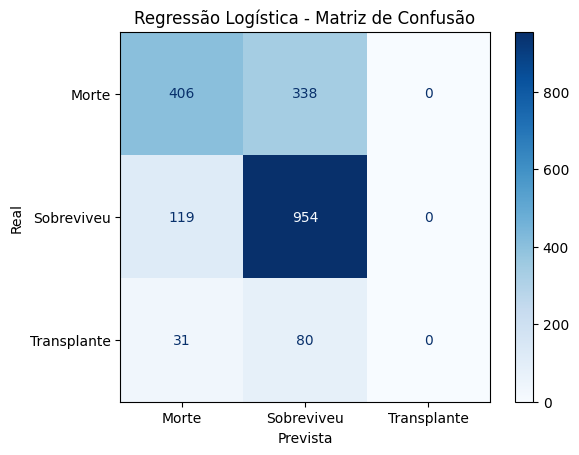

In [340]:
# Matriz de Confusão
matrix1 = confusion_matrix(y_test1, y_pred1)

plt.figure(figsize=(6, 6))

matrixPlot1 = ConfusionMatrixDisplay(confusion_matrix=matrix1, display_labels=logreg1.classes_)
matrixPlot1.plot(cmap=plt.cm.Blues)

plt.title('Regressão Logística - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

* Morte
    - TP (Verdadeiros Positivos): Casos verdadeiros de morte corretamente classificados como morte. ~400

    - FP (Falsos Positivos): Casos não verdadeiros de morte incorretamente classificados como morte. ~150 (sobrevivência + transplante classificados como morte)
    - FN (Falsos Negativos): Casos verdadeiros de morte incorretamente classificados como outras classes. ~300 (morte classificada como sobrevivência)
    - TN (Verdadeiros Negativos): Casos não verdadeiros de morte corretamente classificados como outras classes. ~950 + 0 + ~80 + 0 = ~1000 (sobrevivência corretamente classificada como sobrevivência + transplante corretamente classificado como sobrevivência)

* Sobreviveu
    - TP (Verdadeiros Positivos): Casos verdadeiros de sobrevivência corretamente classificados como sobrevivência. ~950
    - FP (Falsos Positivos): Casos não verdadeiros de sobrevivência incorretamente classificados como sobrevivência. ~300 + ~80 = ~380 (morte + transplante classificados como sobrevivência)
    - FN (Falsos Negativos): Casos verdadeiros de sobrevivência incorretamente classificados como outras classes. ~130 (sobrevivência classificada como morte)
    - TN (Verdadeiros Negativos): Casos não verdadeiros de sobrevivência corretamente classificados como outras classes. ~370 + 0 + ~30 + 0 = ~400 (morte corretamente classificada como morte + transplante corretamente classificado como morte)
* Transplante
    - TP (Verdadeiros Positivos): Casos verdadeiros de transplante corretamente classificados como transplante. 0
    - FP (Falsos Positivos): Casos não verdadeiros de transplante incorretamente classificados como transplante. 0 + 0 = 0 (morte + sobrevivência classificados como transplante)
    - FN (Falsos Negativos): Casos verdadeiros de transplante incorretamente classificados como outras classes. ~30 + ~70 = ~100 (transplante classificado como morte + transplante classificado como sobrevivência)
    - TN (Verdadeiros Negativos): Casos não verdadeiros de transplante corretamente classificados como outras classes. ~400 + ~300 + ~100 + ~1000 = ~1800 (morte corretamente classificada como morte + sobrevivência corretamente classificada como sobrevivência)

* Em *Transplante* é possivel verificar que o modelo não foi capaz de classificar corretamente, isso pode ter ocorrido pois não existem dados suficientes de transplante para que seja possivel a classificação

In [341]:
# Salvando o modelo de regressão para uso futuro
print("O modelo de Regressão Logística foi salvo em:")
dump(logreg1, 'models/death_logreg1.joblib')

O modelo de Regressão Logística foi salvo em:


['models/death_logreg1.joblib']

## **Árvore de Decisão**

* Agora vamos tentar outra alternativa de classificação. Dessa vez, vamos tentar utilizar o algoritmo de Árvore de Decisão, que pode ser útil para nos ajudar a visualizar melhor o que está acontecendo no processo de classificação, e talvez até entregue resultados melhores na acurácia e precisão. 

* Perceba que podemos utilizar as mesmas variáveis X e Y, já que não foram modificadas.

In [342]:
# Instanciar a Árvore de Decisão
clf1 = DecisionTreeClassifier(criterion='entropy', max_depth=8, min_samples_leaf=5)

clf1.fit(X_train1, y_train1)

# Predict da Árvore de Decisão
tree_pred1 = clf1.predict(X_test1)

# Tabela de Resultados
print("Report - Árvore de Decisão:")
print(classification_report(y_test1, tree_pred1, zero_division=0))

Report - Árvore de Decisão:
              precision    recall  f1-score   support

       Morte       0.84      0.80      0.82       744
  Sobreviveu       0.85      0.91      0.88      1073
 Transplante       0.92      0.62      0.74       111

    accuracy                           0.85      1928
   macro avg       0.87      0.78      0.81      1928
weighted avg       0.85      0.85      0.85      1928



* Perceba que a acurácia aumentou consideravelmente, de ~70% para ~80%. Além disso, a classe **Transplante** que antes estava sendo omitida da classificação agora está sendo classificada corretamente. Maravilha!

In [343]:
# Importância dos coeficientes
importances1 = clf1.feature_importances_
feature_importances1 = pd.DataFrame(
    importances1,
    columns = ['Importance'],
    index=df1.drop('Situação', axis=1).columns
).sort_values(by='Importance', ascending=False)

print("\nImportância das Features:")
print(feature_importances1)


Importância das Features:
                                 Importance
Bilirrubina(mg/dl)                 0.535429
Aspartato_Aminotransferase(U/L)    0.134401
Albumina(gm/dl)                    0.134106
Fosfatase_Alcalina (U/L)           0.127990
Tempo_de_Protrombina(s)            0.034242
Estágio                            0.021005
Idade                              0.006143
Plaquetas(ml/1000)                 0.005532
Sexo                               0.001152


* Forte Importância:
    - Bilirrubina(mg/dl): 0.627105
* Importância Moderada:
    - Aspartato_Aminotransferase(U/L): 0.111300
    - Fosfatase_Alcalina (U/L): 0.104742
    - Albumina(gm/dl): 0.085476
* Importância Fraca:
    - Tempo_de_Protrombina(s): 0.040876
    - Estágio: 0.030501
    - Idade: 0.000000
    - Plaquetas(ml/1000): 0.000000

* Agora vamos plottar a nossa árvore de decisão, para que possamos visualizar as etapas que o modelo tomou para alcançar tais resultados.

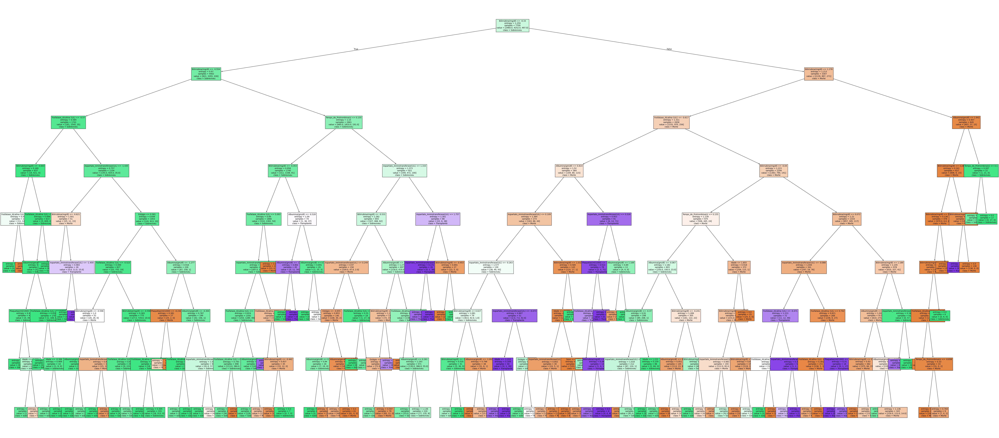

In [344]:
# Plottar a Árvore de Decisão
fig1 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf1,
                      feature_names=df1.drop(columns=['Situação']).columns,
                      class_names=clf1.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

<Figure size 600x600 with 0 Axes>

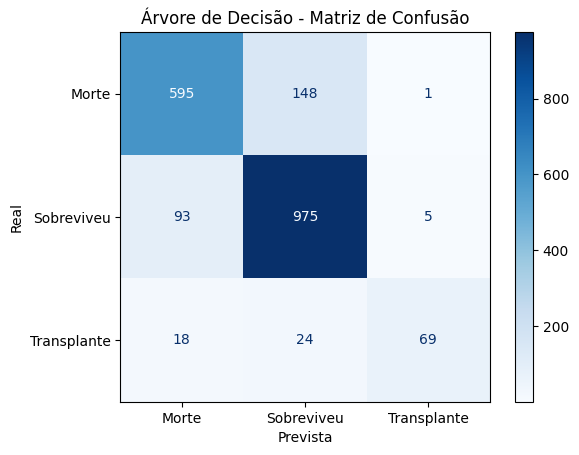

In [345]:
# Matriz de Confusão
matrixTree1 = confusion_matrix(y_test1, tree_pred1)

plt.figure(figsize=(6, 6))

matrixTreePlot1 = ConfusionMatrixDisplay(confusion_matrix=matrixTree1, display_labels=clf1.classes_)
matrixTreePlot1.plot(cmap=plt.cm.Blues)

plt.title('Árvore de Decisão - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

* A matriz de confusão da árvore, diferentemente da matriz de regressão, agora possui valores na coluna *Transplantes*, o que quer dizer que nosso modelo está finalmente sendo capaz de prever e distinguir casos onde os pacientes realizaram um transplante. Ademais, a matriz está bem mais definida, com valores concentrados na diagonal principal, o que quer dizer que a nossa acurácia está bem alta, prevendo corretamente a grande maioria dos casos. 

## **Correção na Árvore de Decisão**

* A nossa árvore de decisão está entregando bons resultados, mas está bem ilegível. Para corrigir isso, vamos modificar alguns parâmetros para que a análise fique mais sucinta (e de fato possível).

* Primeiramente, vamos realizar uma *Grid Search* para encontrar o melhor valor para **ccp_alpha**, um parâmetro que nos ajuda a regularizar a árvore.

In [346]:
# Grid Search
path1 = clf1.cost_complexity_pruning_path(X_train1, y_train1)

param_grid1 = {'ccp_alpha': path1.ccp_alphas}

CV_clf = GridSearchCV(estimator=clf1, param_grid=param_grid1, cv = 7, verbose=2, n_jobs=-1)
CV_clf.fit(X_train1, y_train1)

best_ccp_alpha1 = CV_clf.best_estimator_.ccp_alpha

Fitting 7 folds for each of 94 candidates, totalling 658 fits


* Com o valor em mãos, agora vamos criar outra árvore de decisão com os parâmetros modifiados, com o objetivo de torná-la mais agradável esteticamente sem que haja uma diminuição muito grande da acurácia.

In [347]:
# Instanciar um novo objeto para a Árvore de Decisão Corrigida
clf_ccp1 = DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=4, min_samples_split=20, ccp_alpha=best_ccp_alpha1)

clf_ccp1.fit(X_train1, y_train1)

# Predict da Árvore de Decisão Corrigida
tree_pred1 = clf_ccp1.predict(X_test1)

# Tabela de Resultados
print("Report - Árvore de Decisão Corrigida:")
print(classification_report(y_test1, tree_pred1, zero_division=0))

Report - Árvore de Decisão Corrigida:
              precision    recall  f1-score   support

       Morte       0.77      0.77      0.77       744
  Sobreviveu       0.83      0.86      0.85      1073
 Transplante       0.88      0.57      0.69       111

    accuracy                           0.81      1928
   macro avg       0.83      0.73      0.77      1928
weighted avg       0.81      0.81      0.81      1928



* Com as limitações que colocamos na árvore, a acurácia agora parece se estabilizar na faixa dos ~80%, o que é ótimo pois não houve uma diminuição tão considerável da árvore anterior e ainda assim conseguimos tornar a árvore bem mais interpretável.

In [348]:
# Importância dos coeficientes
importances1 = clf_ccp1.feature_importances_
feature_importances1 = pd.DataFrame(
    importances1,
    columns = ['Importance'],
    index=df1.drop('Situação', axis=1).columns
).sort_values(by='Importance', ascending=False)

print("\nImportância das Features:")
print(feature_importances1)


Importância das Features:
                                 Importance
Bilirrubina(mg/dl)                 0.612017
Aspartato_Aminotransferase(U/L)    0.149724
Albumina(gm/dl)                    0.096092
Fosfatase_Alcalina (U/L)           0.080946
Tempo_de_Protrombina(s)            0.043736
Estágio                            0.013611
Idade                              0.003265
Plaquetas(ml/1000)                 0.000609
Sexo                               0.000000


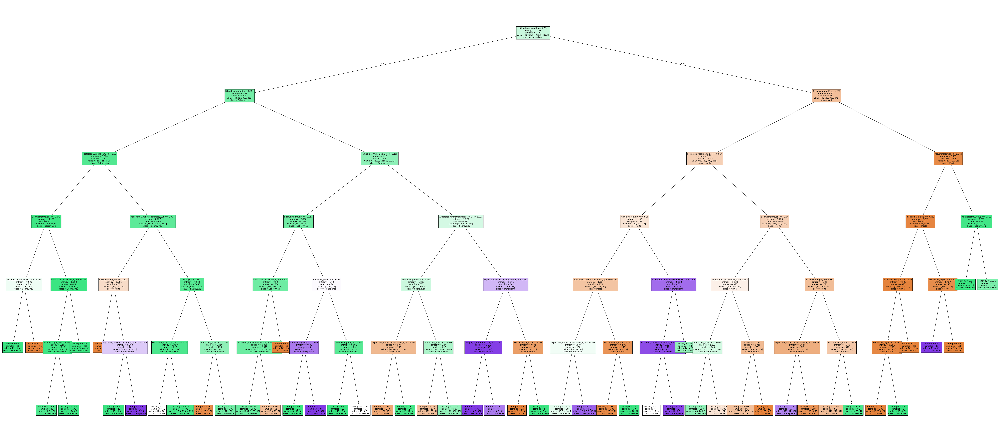

In [349]:
# Árvore de Decisão Corrigida
fig_1 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf_ccp1,
                      feature_names=df1.drop(columns=['Situação']).columns,
                      class_names=clf_ccp1.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

<Figure size 600x600 with 0 Axes>

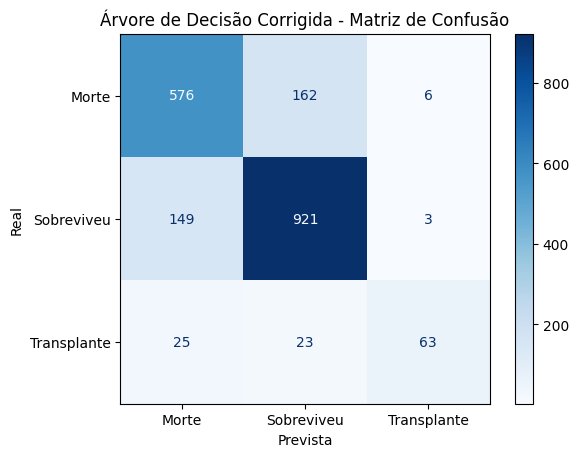

In [350]:
# Matriz de Confusão
matrixTree1 = confusion_matrix(y_test1, tree_pred1)

plt.figure(figsize=(6, 6))

matrixTreePlot1 = ConfusionMatrixDisplay(confusion_matrix=matrixTree1, display_labels=clf_ccp1.classes_)
matrixTreePlot1.plot(cmap=plt.cm.Blues)

plt.title('Árvore de Decisão Corrigida - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

* Nessa matriz de confusão, podemos notar que infelizmente o recall da classe *Transplante* diminuiu, mas isso é consequência do processo que fizemos para tornar a árvore mais legível. Mesmo assim, o elemento 3x3 ainda possui a maior quantia da linha 3, o que significa que, em maioria, o modelo está prevendo corretamente os casos de transplante. 

* Para finalizar, vamos salvar arquivos dos nossos modelos de árvore de decisão para que possamos usá-las em outra situação.

In [351]:
# Salvando os modelos de árvore de decisão para uso futuro
print("O modelo de Árvore de Decisão foi salvo em:")
dump(clf1, 'models/death_tree1.joblib')

O modelo de Árvore de Decisão foi salvo em:


['models/death_tree1.joblib']

In [352]:
print("O modelo de Árvore de Decisão Corrigida foi salvo em:")
dump(clf_ccp1, 'models/death_tree_fixed1.joblib')

O modelo de Árvore de Decisão Corrigida foi salvo em:


['models/death_tree_fixed1.joblib']

---
# Classificação 2: Mesclando Sobrevivência e Transplante
---

## **Importação e Ajuste dos Dados**

In [353]:
df2 = df.copy()

# Considerando o valor de "Transplante" como "Sobreviveu"
df2['Situação'] = df2['Situação'].replace('Transplante', 'Sobreviveu')

print(df2['Situação'].value_counts())
df2

Situação
Sobreviveu    5933
Morte         3704
Name: count, dtype: int64


,Situação,Idade,Sexo,Bilirrubina(mg/dl),Albumina(gm/dl),Fosfatase_Alcalina (U/L),Aspartato_Aminotransferase(U/L),Plaquetas(ml/1000),Tempo_de_Protrombina(s),Estágio
0,Sobreviveu,18499,0,0.5,4.04,598.000000,52.700000,256.0,9.9,1
1,Sobreviveu,19724,1,0.5,3.93,663.000000,45.000000,220.0,10.8,2
2,Sobreviveu,11839,0,0.5,3.54,1243.000000,122.450000,225.0,10.0,2
3,Morte,16467,0,0.7,3.74,1024.000000,77.500000,151.0,10.2,2
4,Morte,21699,0,1.9,3.54,1052.000000,108.500000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...,...
9632,Sobreviveu,17897,0,0.7,3.49,1982.655769,122.556346,243.0,9.7,1
9633,Sobreviveu,23376,0,1.8,3.24,1982.655769,122.556346,139.0,10.5,1
9634,Morte,24585,0,2.1,3.48,2045.000000,89.900000,412.0,11.8,3
9635,Sobreviveu,21324,0,0.9,3.40,1098.000000,122.450000,228.0,10.3,2


* Junção dos dados de sobrevivência e transplante em uma única classe

## **Separação e Normalização dos Dados**

In [354]:
X2 = df2.iloc[:, 1:].values
y2 = df2.iloc[:, 0].values

In [355]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=0)

scaler2 = StandardScaler()
scaler2.fit(X_train2)
X_train2 = scaler2.transform(X_train2)
X_test2 = scaler2.transform(X_test2)

print("Tamanho treinamento: " + str(len(X_train2)))
print("Tamanho teste: " + str(len(X_test2)))

Tamanho treinamento: 7709
Tamanho teste: 1928


In [356]:
print("O modelo do scaler foi salvo em:")
dump(scaler2, 'scalers/death_scaler2.joblib')

O modelo do scaler foi salvo em:


['scalers/death_scaler2.joblib']

## **Regressão Logistica**

In [357]:
# Agora, começar de fato a regressão logística
logreg2 = LogisticRegression(max_iter=4000, n_jobs=-1, C=0.1, penalty='l2')
logreg2.fit(X_train2, y_train2)

# Predict do teste
y_pred2 = logreg2.predict(X_test1)

# Tabela de Resultados
print("Report - Regressão Logística:")
print(classification_report(y_test2, y_pred2, zero_division=0))

Report - Regressão Logística:
              precision    recall  f1-score   support

       Morte       0.38      0.24      0.30       758
  Sobreviveu       0.60      0.75      0.67      1170

    accuracy                           0.55      1928
   macro avg       0.49      0.49      0.48      1928
weighted avg       0.52      0.55      0.52      1928



In [358]:
# Importância dos coeficientes
feature_names2 = df2.columns[1:]
coefficients2 = logreg2.coef_
coef_df2 = pd.DataFrame(coefficients2, columns=feature_names2)
for i, class_name in enumerate(logreg2.classes_):
    sorted_coef2 = coef_df2.iloc[i].sort_values(ascending=False)
    print(f"Importância das Features em relação a {class_name}:\n")
    print(sorted_coef2)
    break

Importância das Features em relação a Morte:

Albumina(gm/dl)                    0.206823
Sexo                               0.012507
Plaquetas(ml/1000)                -0.067311
Idade                             -0.106331
Aspartato_Aminotransferase(U/L)   -0.216516
Fosfatase_Alcalina (U/L)          -0.254932
Tempo_de_Protrombina(s)           -0.269207
Estágio                           -0.317853
Bilirrubina(mg/dl)                -1.087917
Name: 0, dtype: float64


<Figure size 600x600 with 0 Axes>

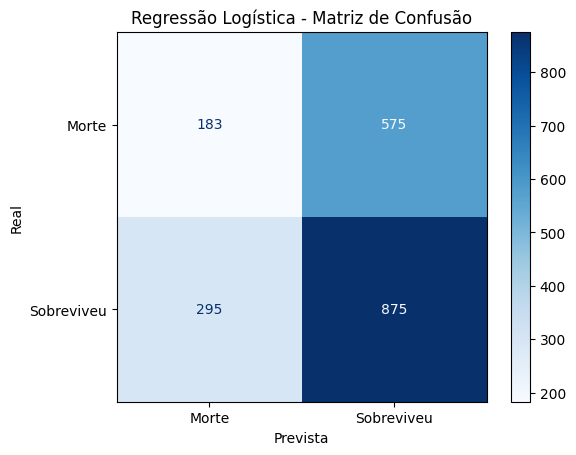

In [359]:
# Matriz de Confusão
matrix2 = confusion_matrix(y_test2, y_pred2)

plt.figure(figsize=(6, 6))

matrixPlot2 = ConfusionMatrixDisplay(confusion_matrix=matrix2, display_labels=logreg2.classes_)
matrixPlot2.plot(cmap=plt.cm.Blues)

plt.title('Regressão Logística - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

In [360]:
# Salvando o modelo de regressão para uso futuro
print("O modelo de Regressão Logística foi salvo em:")
dump(logreg2, 'models/death_logreg2.joblib')

O modelo de Regressão Logística foi salvo em:


['models/death_logreg2.joblib']

## **Árvore de Decisão**

In [361]:
# Instanciar a Árvore de Decisão
clf2 = DecisionTreeClassifier(criterion='entropy', max_depth=8, min_samples_leaf=5)

clf2.fit(X_train2, y_train2)

# Predict da Árvore de Decisão
tree_pred2 = clf2.predict(X_test2)

# Tabela de Resultados
print("Report - Árvore de Decisão:")
print(classification_report(y_test2, tree_pred2, zero_division=0))

Report - Árvore de Decisão:
              precision    recall  f1-score   support

       Morte       0.82      0.79      0.80       758
  Sobreviveu       0.87      0.89      0.88      1170

    accuracy                           0.85      1928
   macro avg       0.84      0.84      0.84      1928
weighted avg       0.85      0.85      0.85      1928



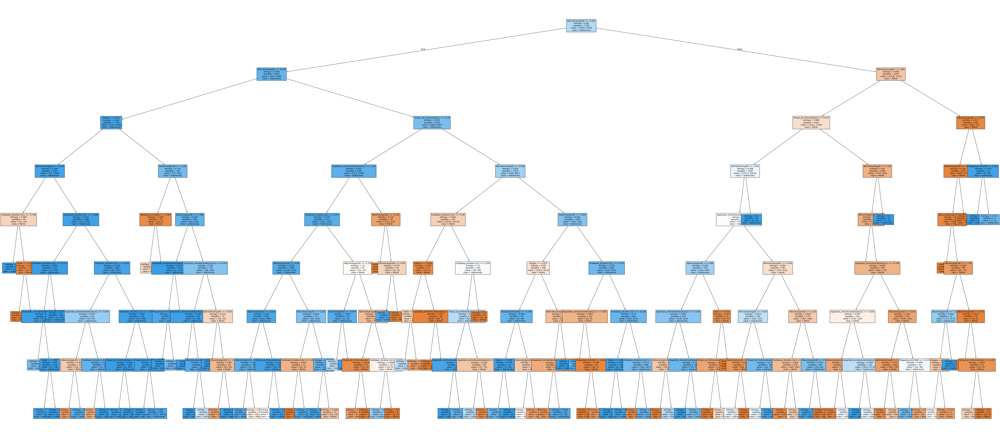

In [362]:
# Plottar a Árvore de Decisão
fig2 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf2,
                      feature_names=df2.drop(columns=['Situação']).columns,
                      class_names=clf2.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

<Figure size 600x600 with 0 Axes>

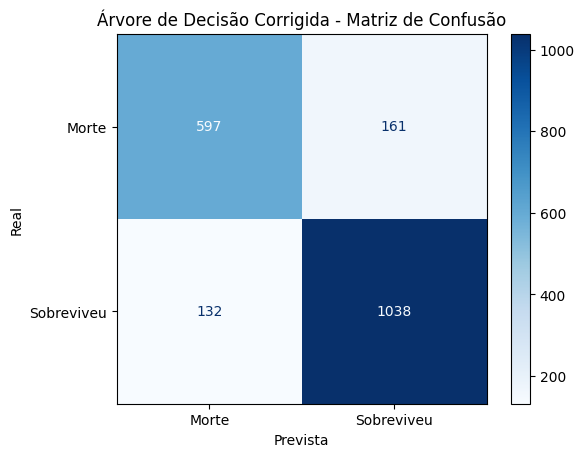

In [363]:
# Matriz de Confusão
matrixTree2 = confusion_matrix(y_test2, tree_pred2)

plt.figure(figsize=(6, 6))

matrixTreePlot2 = ConfusionMatrixDisplay(confusion_matrix=matrixTree2, display_labels=clf_ccp2.classes_)
matrixTreePlot2.plot(cmap=plt.cm.Blues)

plt.title('Árvore de Decisão Corrigida - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

## **Correção na Árvore de Decisão**

In [364]:
# Grid Search
path2 = clf2.cost_complexity_pruning_path(X_train2, y_train2)

param_grid2 = {'ccp_alpha': path2.ccp_alphas}

CV_clf = GridSearchCV(estimator=clf2, param_grid=param_grid2, cv = 7, verbose=2, n_jobs=-1)
CV_clf.fit(X_train2, y_train2)

best_ccp_alpha2 = CV_clf.best_estimator_.ccp_alpha

Fitting 7 folds for each of 75 candidates, totalling 525 fits


In [365]:
# Instanciar um novo objeto para a Árvore de Decisão Corrigida
clf_ccp2 = DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=4, min_samples_split=20, ccp_alpha=best_ccp_alpha2)

clf_ccp2.fit(X_train2, y_train2)

# Predict da Árvore de Decisão Corrigida
tree_pred2 = clf_ccp2.predict(X_test2)

# Tabela de Resultados
print("Report - Árvore de Decisão Corrigida:")
print(classification_report(y_test2, tree_pred2, zero_division=0))

Report - Árvore de Decisão Corrigida:
              precision    recall  f1-score   support

       Morte       0.74      0.72      0.73       758
  Sobreviveu       0.82      0.84      0.83      1170

    accuracy                           0.79      1928
   macro avg       0.78      0.78      0.78      1928
weighted avg       0.79      0.79      0.79      1928



In [366]:
# Importância dos coeficientes
importances2 = clf_ccp2.feature_importances_
feature_importances2 = pd.DataFrame(
    importances2, columns = ['Importance'], index=df2.drop('Situação', axis=1).columns).sort_values(by='Importance', ascending=False)

print("\nImportância das Features:")
print(feature_importances2)


Importância das Features:
                                 Importance
Bilirrubina(mg/dl)                 0.616463
Albumina(gm/dl)                    0.137915
Fosfatase_Alcalina (U/L)           0.078506
Tempo_de_Protrombina(s)            0.067485
Aspartato_Aminotransferase(U/L)    0.066539
Estágio                            0.028719
Plaquetas(ml/1000)                 0.002455
Idade                              0.001917
Sexo                               0.000000


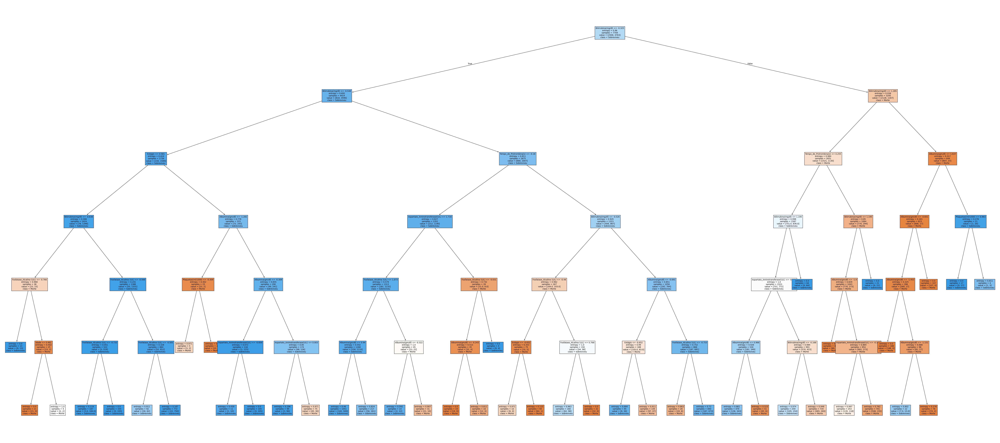

In [367]:
# Árvore de Decisão Corrigida
fig_2 = plt.figure(figsize=(90,40))
_ = tree.plot_tree(clf_ccp2,
                      feature_names=df2.drop(columns=['Situação']).columns,
                      class_names=clf_ccp2.classes_,
                      filled=True,
                      fontsize=10,
                      )

plt.show()

In [368]:
# Salvando os modelos de árvore de decisão para uso futuro
print("O modelo de Árvore de Decisão foi salvo em:")
print(dump(clf2, 'models/death_tree2.joblib'))

print("\nO modelo de Árvore de Decisão Corrigida foi salvo em:")
print(dump(clf_ccp2, 'models/death_tree_fixed2.joblib'))

O modelo de Árvore de Decisão foi salvo em:
['models/death_tree2.joblib']

O modelo de Árvore de Decisão Corrigida foi salvo em:
['models/death_tree_fixed2.joblib']


<Figure size 600x600 with 0 Axes>

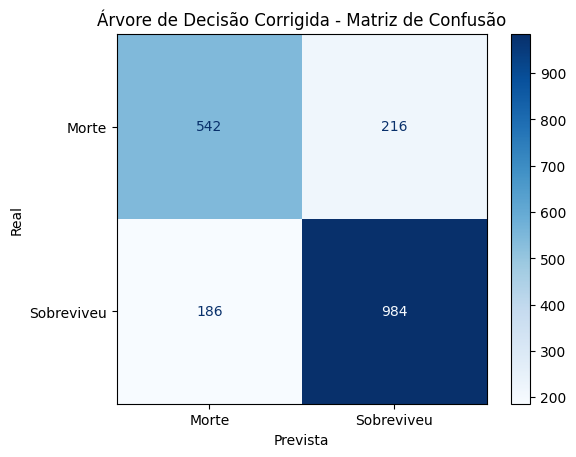

In [369]:
# Matriz de Confusão
matrixTree2 = confusion_matrix(y_test2, tree_pred2)

plt.figure(figsize=(6, 6))

matrixTreePlot2 = ConfusionMatrixDisplay(confusion_matrix=matrixTree2, display_labels=clf_ccp2.classes_)
matrixTreePlot2.plot(cmap=plt.cm.Blues)

plt.title('Árvore de Decisão Corrigida - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

---
# Classificação 3: Ignorando Evento Transplante
---

## **Importação e Ajuste dos Dados**

In [370]:
df3 = df.copy()

# Retira as linhas que possuem a coluna 'Situação' com o valor 'Transplante'
df3 = df3[df3['Situação'] != 'Transplante']

# Transforma a coluna 'Situação' em binário
df3['Situação'] = df3['Situação'].replace({'Morte': 1, 'Sobreviveu': 0})

# Renomeia a coluna 'Situação' para 'Morte'
df3 = df3.rename(columns={'Situação': 'Morte'})

# Mostra as primeiras linhas do dataset
df3

C:\Users\luish\AppData\Local\Temp\ipykernel_6068\771282344.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df3['Situação'] = df3['Situação'].replace({'Morte': 1, 'Sobreviveu': 0})


,Morte,Idade,Sexo,Bilirrubina(mg/dl),Albumina(gm/dl),Fosfatase_Alcalina (U/L),Aspartato_Aminotransferase(U/L),Plaquetas(ml/1000),Tempo_de_Protrombina(s),Estágio
0,0,18499,0,0.5,4.04,598.000000,52.700000,256.0,9.9,1
1,0,19724,1,0.5,3.93,663.000000,45.000000,220.0,10.8,2
2,0,11839,0,0.5,3.54,1243.000000,122.450000,225.0,10.0,2
3,1,16467,0,0.7,3.74,1024.000000,77.500000,151.0,10.2,2
4,1,21699,0,1.9,3.54,1052.000000,108.500000,151.0,11.5,1
...,...,...,...,...,...,...,...,...,...,...
9632,0,17897,0,0.7,3.49,1982.655769,122.556346,243.0,9.7,1
9633,0,23376,0,1.8,3.24,1982.655769,122.556346,139.0,10.5,1
9634,1,24585,0,2.1,3.48,2045.000000,89.900000,412.0,11.8,3
9635,0,21324,0,0.9,3.40,1098.000000,122.450000,228.0,10.3,2


* Retirada dos dados que possuiam Transplante na Situação
* Substituição dos dados, Morte = 1 e Sobreviveu = 0
* Mudança no nome da coluna de Situação para Morte

## **Separação e Normalização de dados**

In [371]:
# Definição das variáveis independentes e dependentes
X = np.array(df3[['Idade', 'Sexo', 'Bilirrubina(mg/dl)','Albumina(gm/dl)','Fosfatase_Alcalina (U/L)','Aspartato_Aminotransferase(U/L)','Plaquetas(ml/1000)','Tempo_de_Protrombina(s)','Estágio']])
Y = np.array(df3['Morte'])

# Divisão dos dados em treino e teste (80% treino e 20% teste)
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2)

# Normalização dos Dados                                                              
scaler3 = StandardScaler()
scaler3.fit(x_train)
x_test = scaler3.transform(x_test)
x_train = scaler3.transform(x_train)

# Mostra o tamanho dos dados de treino e teste
print("Tamanho treinamento: " + str(len(x_train)))
print("Tamanho teste: " + str(len(x_test)))


Tamanho treinamento: 7223
Tamanho teste: 1806


In [372]:
# Salva o scaler
print("O modelo do scaler foi salvo em: ")
dump(scaler3, 'scalers/death_scaler3.joblib')

O modelo do scaler foi salvo em: 


['scalers/death_scaler3.joblib']

* Divisão dos dados para treino e Teste 
* Normalização para que a distribuição do teste fique próxima da do treino
* Salva Scaler

## **Regressão Logística**

In [373]:
# Transformando o Label para Morte e Sobreviveu
lrY_train = ['Morte' if value == 1 else 'Sobreviveu' for value in y_train]
lrY_test = ['Morte' if value == 1 else 'Sobreviveu' for value in y_test]

# Instancia Regressão Logistica
logreg3 = LogisticRegression(max_iter=5000, n_jobs=-1)

# Fit do Classificador
logreg3.fit(x_train, lrY_train)

LogisticRegression(max_iter=5000, n_jobs=-1)

In [374]:
# Erro do treino
N_inputs = len(lrY_train)

# Predição do treino
class_pred = logreg3.predict(x_train)

# Contador de erro
eIn = 0

# Calculando o erro
for i in range(N_inputs):
    # Se a classe predita for diferente da classe real, some 1 ao erro
    if(class_pred[i] != lrY_train[i]):
        eIn += 1

# Calculando a porcentagem de erro
eIn /= N_inputs

# Erro do teste
N_out = len(lrY_test)

# Realiza Predição no teste :
class_pred = logreg3.predict(x_test)

# Contador de erro
eOut = 0
for i in range(N_out):
    # Se a classe predita for diferente da classe real, some 1 ao erro
    if(class_pred[i] != lrY_test[i]):
        eOut += 1

# Calculando a porcentagem de erro
eOut /= N_out


# Mostra o erro no teste
print("Porcentagem de erro: ")
print("Eout = " + str(eOut))  # Erro no teste
# Mostra o erro no treino
print("Ein = " + str(eIn))

# Tabela de Resultados
print("\nReport - Regressão Logística:")
print(classification_report(lrY_test, class_pred))


Porcentagem de erro: 
Eout = 0.2558139534883721
Ein = 0.25100373805897824

Report - Regressão Logística:
              precision    recall  f1-score   support

       Morte       0.78      0.54      0.64       757
  Sobreviveu       0.73      0.89      0.80      1049

    accuracy                           0.74      1806
   macro avg       0.76      0.72      0.72      1806
weighted avg       0.75      0.74      0.73      1806



In [375]:
# Importância dos coeficientes
feature_names3 = df3.columns[1:]
coefficients3 = logreg3.coef_
coef_df3 = pd.DataFrame(coefficients3, columns=feature_names3)
for idx, class_name in enumerate(logreg2.classes_):
    sorted_coef3 = coef_df3.iloc[idx].sort_values(ascending=False)
    print(f"Importância das Features em relação a {class_name}:\n")
    print(sorted_coef3)
    break

Importância das Features em relação a Morte:

Albumina(gm/dl)                    0.210462
Sexo                              -0.024529
Plaquetas(ml/1000)                -0.069664
Idade                             -0.125216
Aspartato_Aminotransferase(U/L)   -0.200148
Tempo_de_Protrombina(s)           -0.249606
Fosfatase_Alcalina (U/L)          -0.256974
Estágio                           -0.315729
Bilirrubina(mg/dl)                -1.300051
Name: 0, dtype: float64


In [376]:
# Salva o modelo 
print("O modelo de Regressão Logística foi salvo em:")
dump(logreg3, 'models/death_logreg3.joblib')


O modelo de Regressão Logística foi salvo em:


['models/death_logreg3.joblib']

* Porcentagem de erro do teste e de treino próximas.
* Acurácia em torno de 73, porém a revocação para a classse morte é baixa indicando um deficit para a classificação do evento morte.


### **Matriz de Confusão**

[[410 347]
 [115 934]]


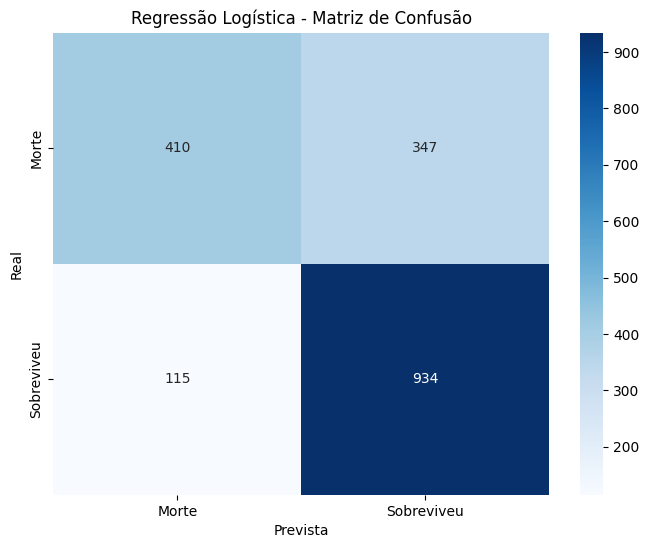

In [377]:
# Cria a matriz de confusão
cm = confusion_matrix(lrY_test, class_pred)
print(cm)

# Plota a matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Morte', 'Sobreviveu'], yticklabels=['Morte', 'Sobreviveu'])
plt.xlabel('Prevista')
plt.ylabel('Real')
plt.title('Regressão Logística - Matriz de Confusão')

# Mostra a matriz de confusão
plt.show()

De Cima Para Baixo da Esquerda para a Direita:
* True Positive (Previsto como Sobreviveu e era Sobreviveu)
* False Negative (Previsto como Morte mas era Sobreviveu)
* False Positive (Previsto como Sobreviveu mas era Morte) 
* True Negative (Previsto como Morte e era Morte) 

## **Árvore de Decisão**

In [378]:
# Instanciar a árvore de decisão
arvore_decisao = DecisionTreeClassifier()

# Ajustar o modelo (fit)
arvore_decisao.fit(x_train, lrY_train)

# Fazer previsões
class_pred_arvore = arvore_decisao.predict(x_test)

# Imprimir o relatório de classificação
print("Report - Árvore de Decisão:")
print(classification_report(lrY_test, class_pred_arvore))


Report - Árvore de Decisão:
              precision    recall  f1-score   support

       Morte       0.92      0.91      0.92       757
  Sobreviveu       0.94      0.94      0.94      1049

    accuracy                           0.93      1806
   macro avg       0.93      0.93      0.93      1806
weighted avg       0.93      0.93      0.93      1806



* Acurácia em torno de 93% indicando uma melhora em relação à Regressão Logística
* Médias e Revocação Indicam que o modelo está Balanceado.

### Minimal Cost Complexity Pruning

In [379]:
# Importação do classificador de Árvore de Decisão
clf3 = DecisionTreeClassifier()

# Cálculo do Caminho de Poda de Complexidade de Custos
path = clf3.cost_complexity_pruning_path(x_train, y_train)

# Definição do Grid de Parâmetros para a busca em grade
param_grid = {'ccp_alpha': path.ccp_alphas}

# Configuração da Validação Cruzada com GridSearchCV
CV_clf3 = GridSearchCV(estimator=clf3, param_grid=param_grid, cv = 7, verbose=2, n_jobs=-1)

# Treinamento do Modelo com GridSearchCV
CV_clf3.fit(x_train, y_train)

# Melhor valor de ccp_alpha
ccp_alpha = CV_clf3.best_params_['ccp_alpha']


Fitting 7 folds for each of 272 candidates, totalling 1904 fits


In [380]:
# Cria uma nova árvore de decisão com o melhor ccp_alpha e definindo limite e niveis
nova_arvore = DecisionTreeClassifier(ccp_alpha=ccp_alpha, criterion='entropy', max_depth=8, min_samples_leaf=5)

# Ajusta a nova árvore aos dados de treinamento
nova_arvore.fit(x_train, lrY_train)

# Faz previsões com a nova árvore
class_pred_arvore = nova_arvore.predict(x_test)

# Imprime o relatório de classificação
print(classification_report(lrY_test, class_pred_arvore))

              precision    recall  f1-score   support

       Morte       0.83      0.81      0.82       757
  Sobreviveu       0.86      0.88      0.87      1049

    accuracy                           0.85      1806
   macro avg       0.85      0.85      0.85      1806
weighted avg       0.85      0.85      0.85      1806



* Acurácia em torno de 84% (possivelmente devido ao limite de niveis)
* Revocação e médias indica balanceamento entre as classes

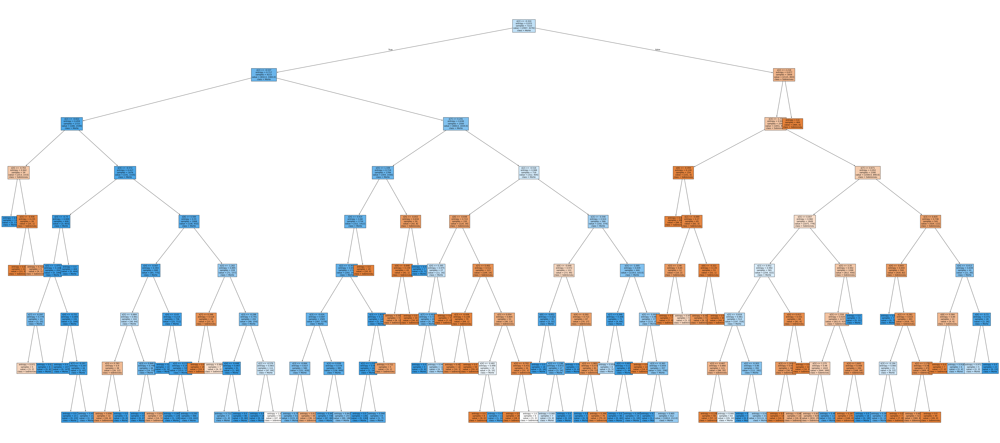

In [381]:
# Cria uma figura para a árvore
plt.figure(figsize=(90, 40))

# Plota a árvore 
plot_tree(nova_arvore, filled=True, class_names=["Sobreviveu", "Morte"], fontsize=10)

# Mostra o gráfico
plt.show()

<Figure size 600x600 with 0 Axes>

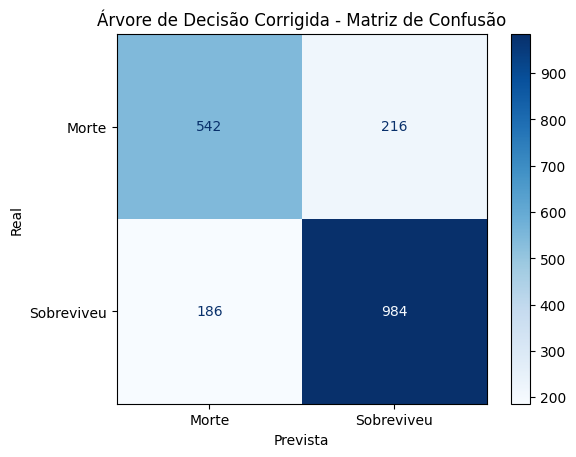

In [382]:
# Matriz de Confusão
matrixTree3 = confusion_matrix(lrY_test, class_pred_arvore)

plt.figure(figsize=(6, 6))

matrixTreePlot3 = ConfusionMatrixDisplay(confusion_matrix=matrixTree2, display_labels=nova_arvore.classes_)
matrixTreePlot3.plot(cmap=plt.cm.Blues)

plt.title('Árvore de Decisão Corrigida - Matriz de Confusão')
plt.xlabel('Prevista')
plt.ylabel('Real')

plt.show()

* A Imagem acima mostra a forma que a árvore de decisão funciona.

In [383]:
# Salvando os modelos de árvore de decisão para uso futuro
print("O modelo de Árvore de Decisão foi salvo em:")
print(dump(arvore_decisao, 'models/death_tree3.joblib'))

print("\nO modelo de Árvore de Decisão Corrigida foi salvo em:")
print(dump(nova_arvore, 'models/death_tree_fixed3.joblib'))

O modelo de Árvore de Decisão foi salvo em:
['models/death_tree3.joblib']

O modelo de Árvore de Decisão Corrigida foi salvo em:
['models/death_tree_fixed3.joblib']
